In [1]:
import pandas as pd
import geopandas
import os
import seaborn as sns
import numpy as np

In [2]:
FETCH_CURRENT = True

if FETCH_CURRENT:
    report_path = "https://www.maine.gov/dep/ftp/hoss/spill_report.txt"
    report_product_found_path = "https://www.maine.gov/dep/ftp/hoss/report_product_found.txt"
    report_inc_medium_path = "https://www.maine.gov/dep/ftp/hoss/report_inc_medium.txt"
else:
    hoss_path = "../maine-data/environmental/HOSS"
    report_path = os.path.join(hoss_path, "spill_report.txt")
    report_product_found_path = os.path.join(hoss_path, "report_product_found.txt")
    report_inc_medium_path = os.path.join(hoss_path, "report_inc_medium.txt")

In [3]:
report_header = ["L.SPILL_NUMBER",
    "CREATE_DATE",
    "CREATE_BY",
    "MODIFY_DATE",
    "MODIFY_BY",
    "REPORT_STATUS",
    "REPORT_STATUS_VALUE",
    "ACTUAL_SPILL_DATETIME",
    "ACTUAL_SPILL_DATE_UNKNOWN_FLAG",
    "ACTUAL_SPILL_TIME_UNKNOWN_FLAG",
    "LOCATION_NAME",
    "LOCATION_DESCRIPTION",
    "LOCATION_TOWN_MCD",
    "LOCATION_TOWN_MCD_VALUE",
    "LOCATION_TOWN_LOCAL_NAME",
    "LOCATION_STATE_PROVINCE",
    "NUMBER_WELLS_AT_RISK",
    "NUMBER_WELLS_IMPACTED",
    "DTREE_COMPLETED_FLAG",
    "DTREE_DATE",
    "DTREE_CODE",
    "DTREE_VALUE",
    "MATERIAL_DISPOSAL_INFO",
    "FURTHER_RESPONSE_ACTION_FLAG",
    "SPILL_TYPE_CODE",
    "SPILL_TYPE_VALUE",
    "REPORTER_TYPE_CODE",
    "REPORTER_TYPE_VALUE",
    "DETECTION_METHOD_CODE",
    "DETECTION_METHOD_VALUE",
    "INC_LOCATION_CODE",
    "INC_LOCATION_VALUE",
    "INC_SOURCE_CODE",
    "INC_SOURCE_VALUE",
    "SPILL_CAUSE_CODE",
    "SPILL_CAUSE_VALUE"]
report_df = pd.read_csv(report_path, header=None, names=report_header, delimiter="*", on_bad_lines='warn', index_col=0)

/tmp/ipykernel_12967/2486885791.py:37: ParserWarning: Skipping line 56678: expected 36 fields, saw 38

  report_df = pd.read_csv(report_path, header=None, names=report_header, delimiter="*", on_bad_lines='warn', index_col=0)
/tmp/ipykernel_12967/2486885791.py:37: DtypeWarning: Columns (19,20,21,26) have mixed types. Specify dtype option on import or set low_memory=False.
  report_df = pd.read_csv(report_path, header=None, names=report_header, delimiter="*", on_bad_lines='warn', index_col=0)


In [4]:
report_medium_header = [
    "L.SPILL_NUMBER",
    "MEDIUM_CODE",
    "MEDIUM_VALUE"]
report_medium_df = pd.read_csv(report_inc_medium_path, header=None, names=report_medium_header, delimiter="*", on_bad_lines='warn', index_col=0)

In [5]:
report_product_found_header = [
    "L.SPILL_NUMBER",
    "PRODUCT_CODE",
    "PRODUCT_CODE_VALUE",
    "PRODUCT_OTHER",
    "PRODUCT_AMOUNT",
    "PRODUCT_AMOUNT_UNIT",
    "PRODUCT_AMOUNT_UNIT_VALUE",
    "PRODUCT_AMOUNT_QUALIFIER",
    "PRIMARY_PRODUCT_FLAG"]
report_product_found_df = pd.read_csv(report_product_found_path, header=None, names=report_product_found_header, delimiter="*", on_bad_lines='warn', index_col=0)

In [6]:
# Convert the 'ACTUAL_SPILL_DATETIME' column to datetime format
report_df['ACTUAL_SPILL_DATETIME'] = pd.to_datetime(report_df['ACTUAL_SPILL_DATETIME'], errors='coerce')
report_df['CREATE_DATE'] = pd.to_datetime(report_df['CREATE_DATE'], errors='coerce')


In [7]:
report_recent_df = report_df[report_df['CREATE_DATE'].dt.year >= 2015]
report_recent_df.shape

(21873, 35)

In [8]:
report_recent_df = report_recent_df.join(report_product_found_df, on='L.SPILL_NUMBER', how='left') \
    .join(report_medium_df, on='L.SPILL_NUMBER', how='left')

In [9]:
# Converts oz. to gals.
report_recent_df['PRODUCT_AMOUNT'] = report_recent_df.apply(
    lambda row: row['PRODUCT_AMOUNT'] * 0.0078125 if row['PRODUCT_AMOUNT_UNIT_VALUE'] == 'oz.' else row['PRODUCT_AMOUNT'], axis=1)
report_recent_df['PRODUCT_AMOUNT_UNIT_VALUE'] = report_recent_df['PRODUCT_AMOUNT_UNIT_VALUE'].replace('oz.', 'gals.')

In [10]:
report_recent_df['PRODUCT_AMOUNT_UNIT_VALUE'].value_counts()

PRODUCT_AMOUNT_UNIT_VALUE
gals.       18226
lbs.          210
cu. yds.       39
tons            6
Bbls.           4
Name: count, dtype: int64

In [11]:
# Only keep spills with liquid measurement unit
report_recent_df = report_recent_df[report_recent_df['PRODUCT_AMOUNT_UNIT_VALUE'] == 'gals.']

In [12]:
report_recent_df['SPILL_TYPE_VALUE'].value_counts()


SPILL_TYPE_VALUE
Oil Incident                       16904
Hazardous Material Incident          951
Non-Oil, Non-Hazardous Incident      371
Name: count, dtype: int64

In [13]:
# Discard the Non-oil, Non-Hazardous Incident
report_recent_df = report_recent_df[report_recent_df['SPILL_TYPE_VALUE'] != 'Non-Oil, Non-Hazardous Incident']
# Discard spills that had 0 amount
report_recent_df = report_recent_df[report_recent_df['PRODUCT_AMOUNT'] > 0]

In [14]:
report_recent_df.index.value_counts()

L.SPILL_NUMBER
A-1-2019      9
B-161-2023    9
P-307-2016    8
P-196-2023    8
P-434-2019    8
             ..
I-249-2018    1
B-367-2019    1
B-351-2019    1
B-305-2020    1
B-329-2020    1
Name: count, Length: 14750, dtype: int64

In [15]:
# View data for a spill that has multiple rows
report_recent_df.loc[['B-235-2025', 'B-129-2025', 'A-64-2025'], ['PRODUCT_AMOUNT', 'LOCATION_TOWN_LOCAL_NAME', 'PRODUCT_CODE_VALUE', 'PRIMARY_PRODUCT_FLAG']]

,PRODUCT_AMOUNT,LOCATION_TOWN_LOCAL_NAME,PRODUCT_CODE_VALUE,PRIMARY_PRODUCT_FLAG
L.SPILL_NUMBER,,,,
B-235-2025,2.0,EAST MILLINOCKET,HYDRAULIC OIL,F
B-235-2025,2.0,EAST MILLINOCKET,HYDRAULIC OIL,F
B-235-2025,0.2,EAST MILLINOCKET,WASTE OIL/USED MOTOR OIL,F
B-235-2025,0.2,EAST MILLINOCKET,WASTE OIL/USED MOTOR OIL,F
B-235-2025,5.0,EAST MILLINOCKET,DIESEL,T
B-235-2025,5.0,EAST MILLINOCKET,DIESEL,T
B-129-2025,1.5,ORLAND,WASTE OIL/USED MOTOR OIL,F
B-129-2025,1.5,ORLAND,WASTE OIL/USED MOTOR OIL,F
B-129-2025,1.8,ORLAND,ANTI-FREEZE,T


,L.SPILL_NUMBER,LOCATION_TOWN_MCD_VALUE,PRODUCT_AMOUNT
0,B-175-2020,ABBOT,0.99
1,P-387-2022,ACTON,50.00
2,B-431-2018,ADDISON,90.00
3,A-120-2017,ALBION,250.00
4,A-777-2024,ALDER STREAM TWP,1.00
...,...,...,...
584,B-443-2015,WOODVILLE,50.00
585,P-720-2018,WOOLWICH,660.00
586,A-121-2025,WYMAN TWP,21.00
587,P-603-2022,YARMOUTH,800.00


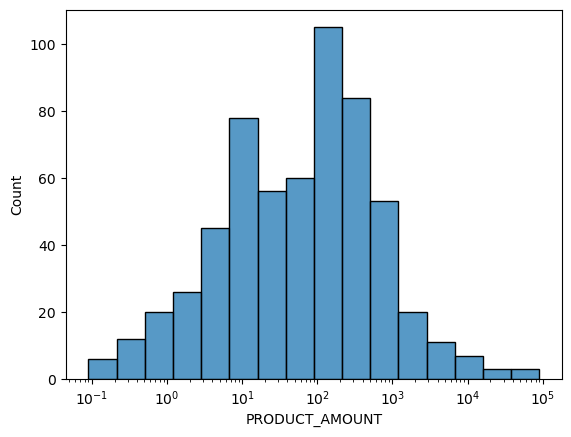

In [16]:
# Calculate total (liquid) amount in each spill
report_town_spill_total = report_recent_df.groupby(['L.SPILL_NUMBER', 'LOCATION_TOWN_MCD_VALUE'])['PRODUCT_AMOUNT'].sum().to_frame().reset_index()
report_town_spill_total['PRODUCT_AMOUNT'] = np.round(report_town_spill_total['PRODUCT_AMOUNT'], 2)
# For each town, get the spill with the largest product amount
idx = report_town_spill_total.groupby('LOCATION_TOWN_MCD_VALUE')['PRODUCT_AMOUNT'].idxmax()
report_town_spill_total = report_town_spill_total.loc[idx].reset_index(drop=True)
sns.histplot(report_town_spill_total, x='PRODUCT_AMOUNT', log_scale=True)
report_town_spill_total

In [17]:
# Subset report_recent_df on spills with largest amount
print("Before shape", report_recent_df.shape)
report_recent_df = report_recent_df.loc[report_town_spill_total['L.SPILL_NUMBER']]
print("After shape", report_recent_df.shape)


Before shape (17218, 45)
After shape (967, 45)


In [18]:
# Create column for comma delimited product code values
report_all_product_vals = report_recent_df.groupby("L.SPILL_NUMBER")['PRODUCT_CODE_VALUE'].unique().apply(lambda x: ',<br> '.join(x))

In [19]:
#create column for comma delimited medium value
report_all_medium_vals = report_recent_df.fillna("").groupby("L.SPILL_NUMBER")['MEDIUM_VALUE'].unique().apply(lambda x: ',<br> '.join(x))

In [20]:
report_mapped_df = report_town_spill_total.merge(report_all_product_vals, on='L.SPILL_NUMBER').merge(report_all_medium_vals, on='L.SPILL_NUMBER')
report_mapped_df = report_mapped_df.merge(report_df[['LOCATION_DESCRIPTION', 'CREATE_DATE']], on="L.SPILL_NUMBER")
report_mapped_df = report_mapped_df.fillna("")
report_mapped_df

,L.SPILL_NUMBER,LOCATION_TOWN_MCD_VALUE,PRODUCT_AMOUNT,PRODUCT_CODE_VALUE,MEDIUM_VALUE,LOCATION_DESCRIPTION,CREATE_DATE
0,B-175-2020,ABBOT,0.99,TRANSFORMER OIL,Land,"2 PINE LANE, POLE 65.2",2020-04-17
1,P-387-2022,ACTON,50.00,DIESEL,Land,532 H ROAD,2022-08-04
2,B-431-2018,ADDISON,90.00,#2 FUEL OIL,"Interior Surface,<br> Land",133 EAST SIDE,2018-07-24
3,A-120-2017,ALBION,250.00,#1 FUEL OIL - KEROSENE,Land,510 BENTON ROAD,2017-03-21
4,A-777-2024,ALDER STREAM TWP,1.00,DIESEL,Land,RT. 27 NB,2024-12-04
...,...,...,...,...,...,...,...
584,B-443-2015,WOODVILLE,50.00,HYDRAULIC OIL,Engineered Containment,ROUTE 157,2015-07-17
585,P-720-2018,WOOLWICH,660.00,#2 FUEL OIL,"Land,<br> Groundwater,<br> Interior Surface",324 MIDDLE ROAD,2018-09-24
586,A-121-2025,WYMAN TWP,21.00,TRANSFORMER OIL,Land,30 CALON DRIVE,2025-03-08
587,P-603-2022,YARMOUTH,800.00,#6 FUEL OIL,"Coastal Water,<br> Inland Surface Water,<br> L...",677 COUSINS STREET,2022-10-26


In [21]:
# Plot info on largest spill in each town in the last 5 years
# Include info on products involved in spill and effected material(s)
gdf = geopandas.read_file("../maine-data/geo/geojson_maine_towns.json")
gdf.head()

,OBJECTID,TOWN,GlobalID,created_user,created_date,last_edited_user,last_edited_date,Shape__Area,Shape__Length,geometry
0,1,Frenchboro,ee8bb63d-54d4-455e-9948-d40898324057,Emily.Pettit@maine.gov_maine,2024-02-27 23:11:49.298000+00:00,Emily.Pettit@maine.gov_maine,2024-02-27 23:11:49.298000+00:00,3.064595e+04,1410.535089,"MULTIPOLYGON (((-67.09989 44.50026, -67.10004 ..."
1,2,Abbot,0047b8de-4caf-4abe-8782-edbcdca48245,Emily.Pettit@maine.gov_maine,2024-02-27 23:11:49.298000+00:00,Emily.Pettit@maine.gov_maine,2024-02-27 23:11:49.298000+00:00,9.238878e+07,38485.033723,"POLYGON ((-69.40209 45.16091, -69.40416 45.160..."
2,3,Acton,cc6bccdf-4ecc-4170-8dd0-1eb0396da924,Emily.Pettit@maine.gov_maine,2024-02-27 23:11:49.298000+00:00,Emily.Pettit@maine.gov_maine,2024-02-27 23:11:49.298000+00:00,1.064538e+08,53561.995004,"POLYGON ((-70.90845 43.5976, -70.90702 43.5941..."
3,4,Adamstown Twp,5d1fb48e-0374-48d8-a41d-1c83ef53da1c,Emily.Pettit@maine.gov_maine,2024-02-27 23:11:49.298000+00:00,Emily.Pettit@maine.gov_maine,2024-02-27 23:11:49.298000+00:00,1.000542e+08,40046.363605,"POLYGON ((-70.80454 44.92494, -70.81043 44.924..."
4,5,Addison,aa0b064c-af0b-457d-8a64-2dc29ff10202,Emily.Pettit@maine.gov_maine,2024-02-27 23:11:49.298000+00:00,Emily.Pettit@maine.gov_maine,2024-02-27 23:11:49.298000+00:00,2.600747e+08,79762.959465,"POLYGON ((-67.6644 44.64325, -67.66435 44.6432..."


In [22]:
# Capitalize town names
gdf['TOWN'] = gdf['TOWN'].str.upper()
gdf = gdf[['TOWN', 'geometry']]

In [23]:
# Check if any town names in our report aren't in geojson data
set(report_mapped_df['LOCATION_TOWN_MCD_VALUE'].tolist()) - set(gdf['TOWN'].tolist())

{'MAGALLOWAY PLT',
 'OXBOW TWP',
 'ROCKWOOD STRIP T02 R01 NBKP',
 'T01 R09 WELS',
 'T02 R08 NWP',
 'T02 R09 NWP',
 'T03 R04 BKP WKR',
 'T05 R07 WELS',
 'T05 R11 WELS',
 'T06 R08 WELS',
 'T06 R17 WELS',
 'T08 R03 NBPP',
 'T08 R04 NBPP',
 'T08 R05 WELS',
 'T08 R17 WELS',
 'T09 R07 WELS',
 'T11 R07 WELS',
 'T11 R08 WELS',
 'T11 R09 WELS',
 'T12 R08 WELS',
 'T12 R09 WELS',
 'T13 R05 WELS',
 'T13 R07 WELS',
 'T13 R08 WELS',
 'T13 R09 WELS',
 'T14 R05 WELS',
 'T14 R06 WELS',
 'T14 R07 WELS',
 'T14 R08 WELS',
 'T14 R09 WELS',
 'T15 R05 WELS',
 'T15 R08 WELS',
 'T16 MD',
 'T16 R05 WELS',
 'T16 R08 WELS',
 'T17 R03 WELS',
 'T22 MD',
 'T28 MD',
 'T32 MD'}

In [24]:
# Replace
lookup = {
    "MAGALLOWAY PLT" : "MAGALLOWAY TWP",
    "OXBOW PLT" : "OXBOW TWP",
    "T0": "T",
    "R0": "R",
    " MD BPP" : " MD"
}
for k, v in lookup.items():
    report_mapped_df['LOCATION_TOWN_MCD_VALUE'] = report_mapped_df['LOCATION_TOWN_MCD_VALUE'].str.replace(k,v)
    gdf['TOWN'] = gdf['TOWN'].str.replace(k,v)

# Check if any town names in our report aren't in geojson data
set(report_mapped_df['LOCATION_TOWN_MCD_VALUE'].tolist()) - set(gdf['TOWN'].tolist())

{'T17 R3 WELS'}

In [25]:
# Set Maine location coordinate system
gdf = gdf.to_crs(epsg=3463)

In [26]:
spill_gdf = gdf.merge(report_mapped_df, left_on='TOWN', right_on='LOCATION_TOWN_MCD_VALUE')
spill_gdf = spill_gdf.to_crs(gdf.crs)
spill_gdf['PRODUCT_AMOUNT']
def apply_title_if_string(value):
    if isinstance(value, str):
        return value.title() if value != "NA" and value != "ME" else value
    return value
spill_gdf = spill_gdf.map(apply_title_if_string)

In [27]:
fields = ['L.SPILL_NUMBER', 'TOWN', 'LOCATION_DESCRIPTION', 'PRODUCT_AMOUNT', 'PRODUCT_CODE_VALUE', 'MEDIUM_VALUE', 'CREATE_DATE']
# fields=['L.SPILL_NUMBER']
aliases = ['Spill Number', 'Town', 'Location', 'Amount Spilled (gals.)', 'Products Spilled', 'Medium Affected', 'Date']
m = spill_gdf.explore(column="PRODUCT_AMOUNT",
                  scheme="UserDefined", 
                  classification_kwds = dict(
                      bins=[10, 100, 1_000, 10_000, 20_000]
                  ),
                  legend=True,  # show legend
                  k=5,  # Bins
                  cmap='plasma',
                  tooltip=fields,
                  tooltip_kwds=dict(
                    aliases=aliases,
                    localize=True # Adds commas to numbers
                  ),
                  style_kwds=dict(
                      fillOpacity=0.7,
                      weight=1
                  ),
                  legend_kwds=dict(
                      caption='Largest spill in past 10 years (gals.)',
                      fmt="{0:,.0f}",
                      colorbar=False,
                      interval=True
                  ),
                  control_scale=False,
                  attr="""© OpenStreetMap contributors | Spill data from <a href="https://www.maine.gov/dep/hoss/">https://www.maine.gov/dep/hoss/</a>
                          | See <a href="https://github.com/matthewse19/maine-data-analysis">here</a> for data methods"""
                  )
m.save("./out/hoss.html")
m.save("../github-pages/HOSS-gh-page/index.html")

m